In [ ]:
# Plotting the mean value for each range of wavelengths for calculating balmer strength

In [ ]:
# Plotting normalised spectra

In [ ]:
import numpy as np
from matplotlib.pyplot import *
import itertools
import time
from prospectFunctions import *

In [ ]:
grid_ranges = {}
grid_ranges['logzsol'] = np.linspace(-1,.5,10)
grid_ranges['dust2'] = np.linspace(0,3,10)
grid_ranges['tage'] = np.linspace(7,9,10)

logzs = grid_ranges['logzsol']
dusts = grid_ranges['dust2']
tages = grid_ranges['tage']

run_params = {}
run_params['zred'] = 3.548
run_params['mass'] = 1e8
run_params['add_duste'] = False
run_params['zcontinuous'] = 1

obs = getObs(**run_params)
sps = getSps(**run_params)
wspec, wphot = getWave(obs=obs,sps=sps,**run_params)

In [9]:
data_grid_params = np.load('params.npy')
data_grid_spec = np.load('specs.npy')

In [10]:
data_grid_means = np.empty([10,10,10,7])

In [11]:
def plotVerticalLines(start, end, zred=None, **extras):

    a = 1.0 + zred
    
    y = np.linspace(0,1e10,2)
    
    lower = np.ones(2)*start*a
    upper = np.ones(2)*end*a

    alpha = 0.8
    lw = 1
    ls = '--'
    
    # plot(balmer,y,color='black',alpha=alpha+.2)
    
    plot(lower,y,color='black',ls=ls,lw=lw,alpha=alpha)
    plot(upper,y,color='black',ls=ls,lw=lw,alpha=alpha)

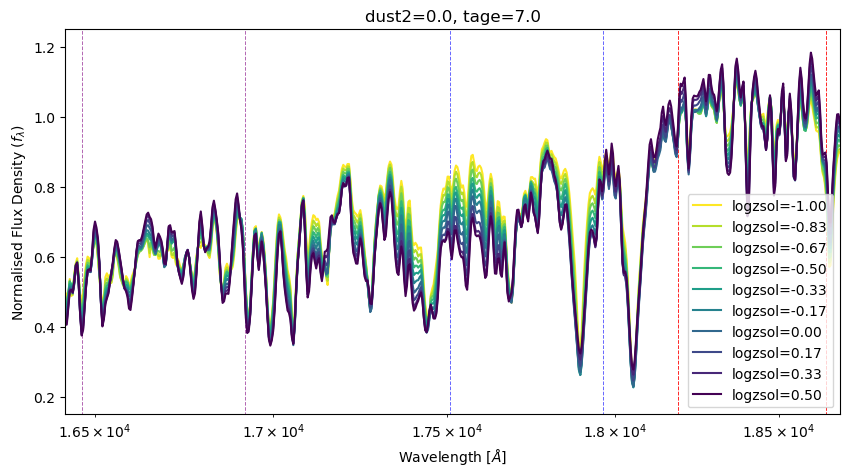

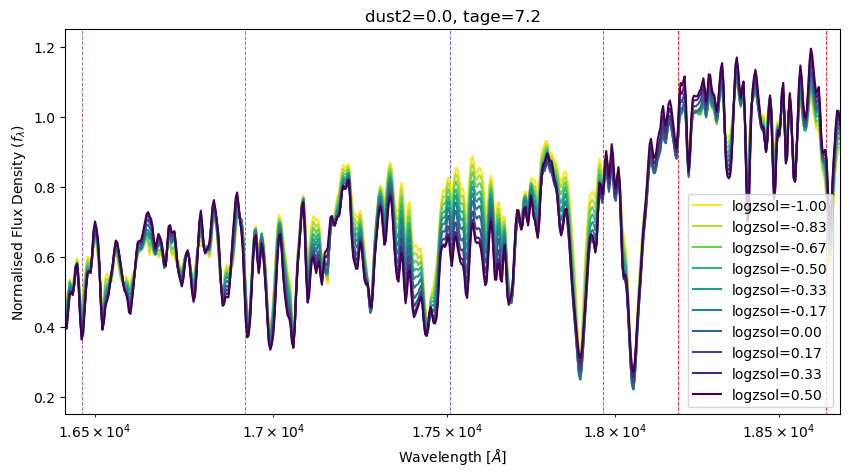

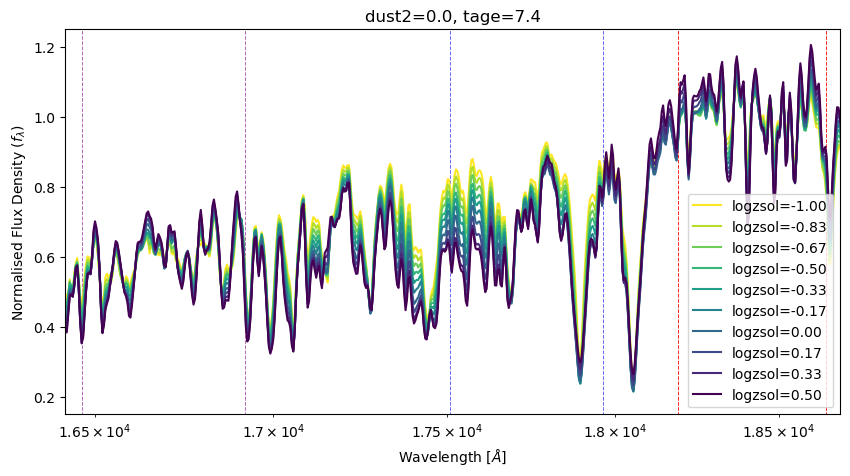

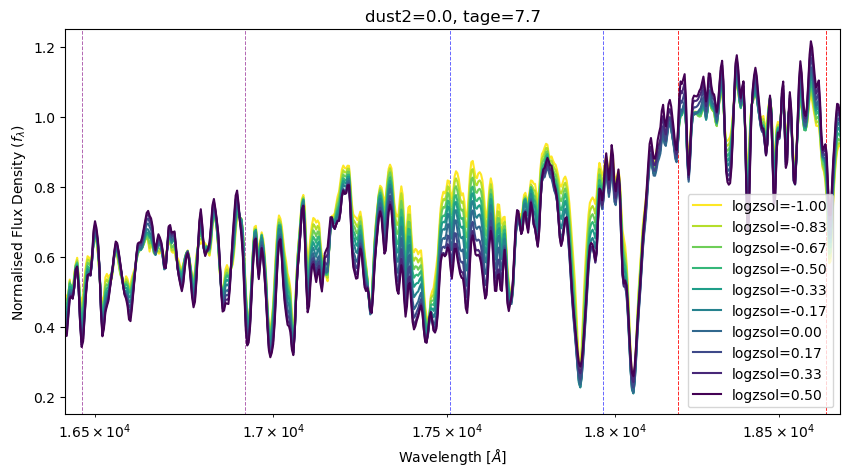

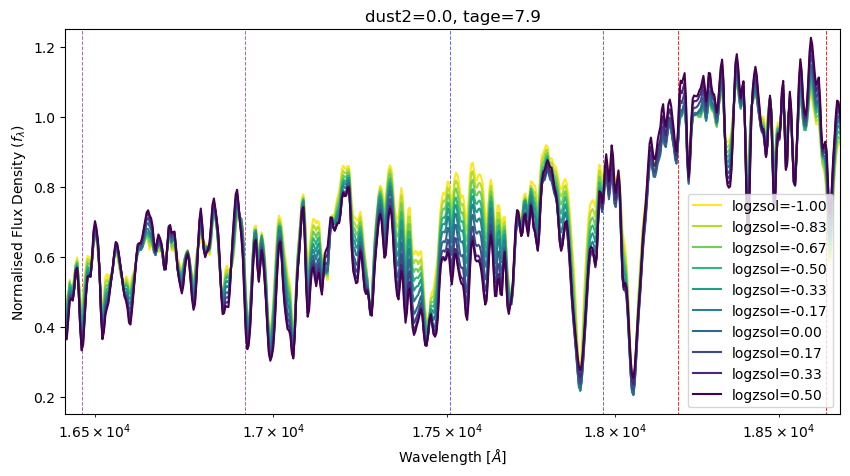

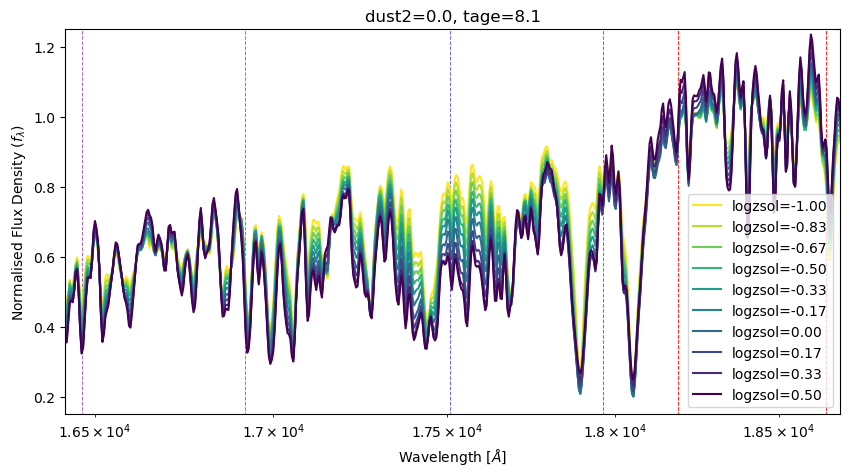

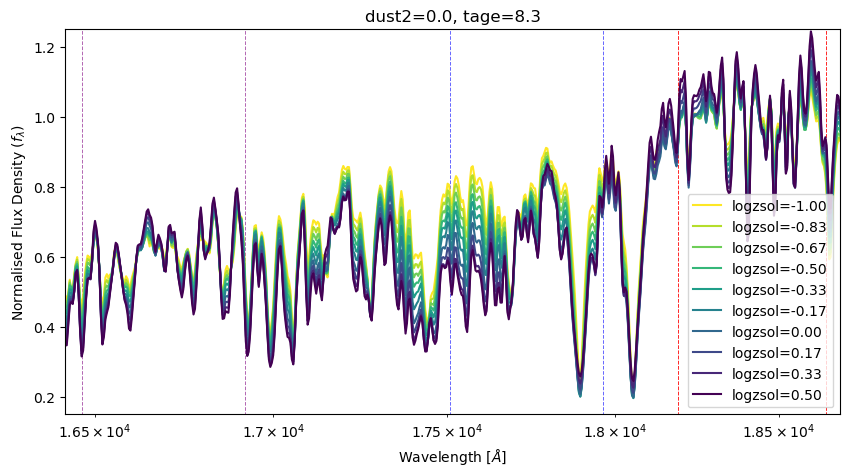

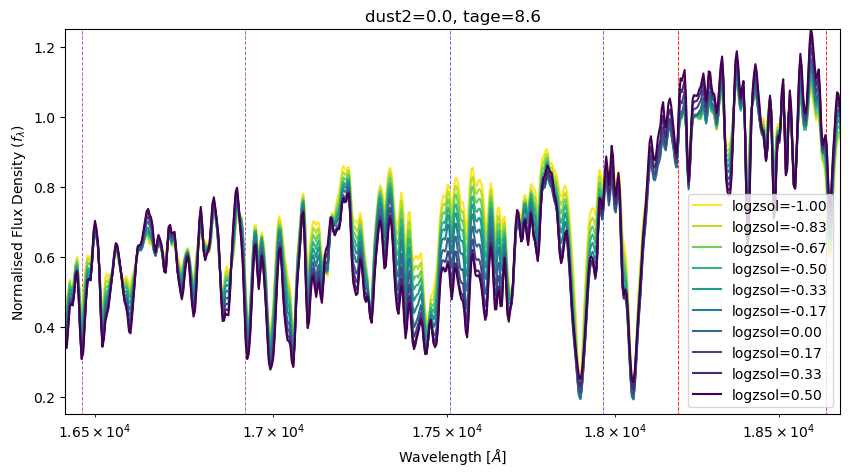

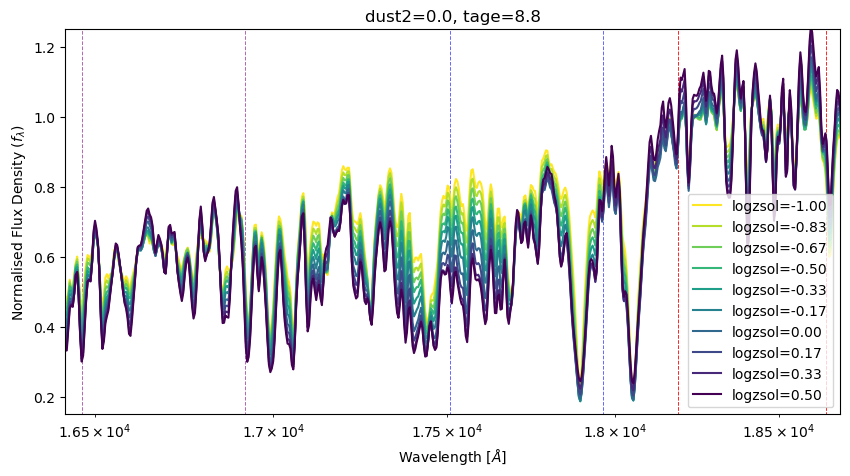

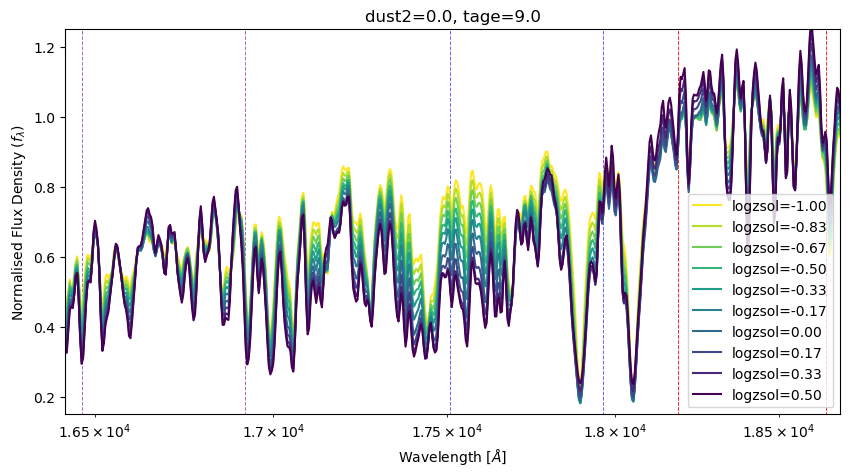

In [17]:
a = 1.0 + run_params['zred']

color = cm.viridis_r(np.linspace(0, 1, len(logzs)))

i_dust = 0

bounds = getBreakBounds(wspec, 4115, **run_params)
blue_l, blue_u = bounds['blue'][0], bounds['blue'][1]

for i_tage in range(len(tages)):

    figure(figsize=(10,5))
    
    plotBalmerBreak(**run_params)
    plotBalmerBreakD4000(**run_params)
    
    plotVerticalLines(4115, 4215, **run_params)
    
    for i_logz in range(len(logzs)):
        test_mean = data_grid_spec[i_logz,i_dust,i_tage,blue_l:blue_u].mean()
        plot(wspec, data_grid_spec[i_logz,i_dust,i_tage,:]/test_mean, color=color[i_logz], lw=1.5, label=f'logzsol={logzs[i_logz]:.2f}')
    
    xmin, xmax = (3610)*a, (4110)*a
    
    xlim([xmin,xmax])
    xscale('log')
    ylim([1.5e-1, 12.5e-1])

    title_text = f'dust2={dusts[i_dust]:.1f}, tage={tages[i_tage]:.1f}'
    title(title_text)

    xlabel(r'Wavelength [$\AA$]')
    ylabel(r'Normalised Flux Density ($f_\lambda$)')

    legend()
    
    show()

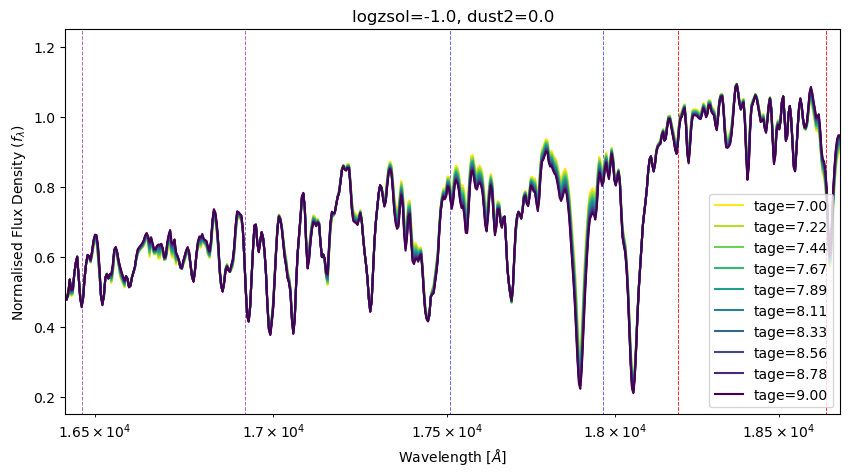

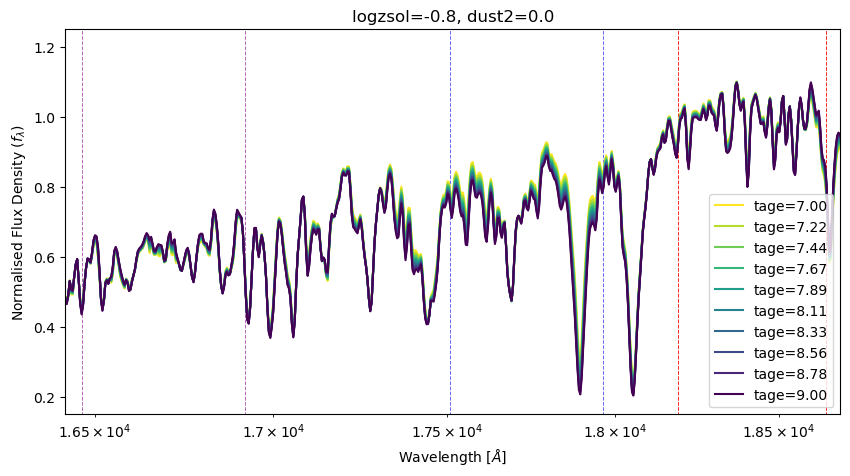

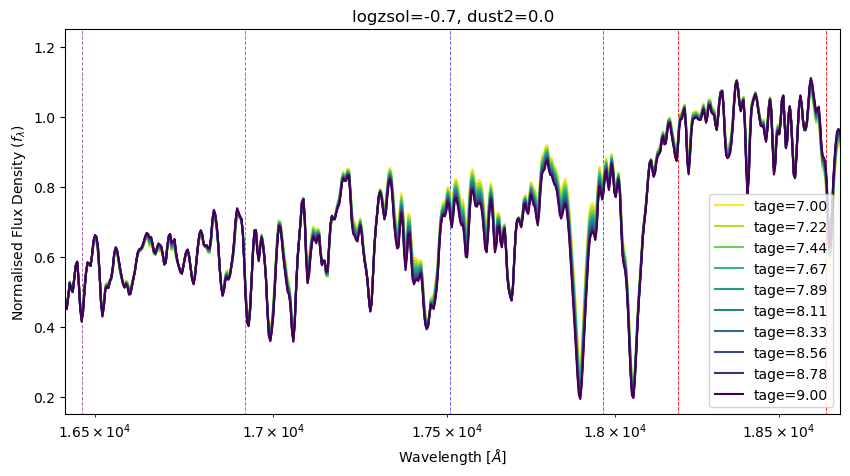

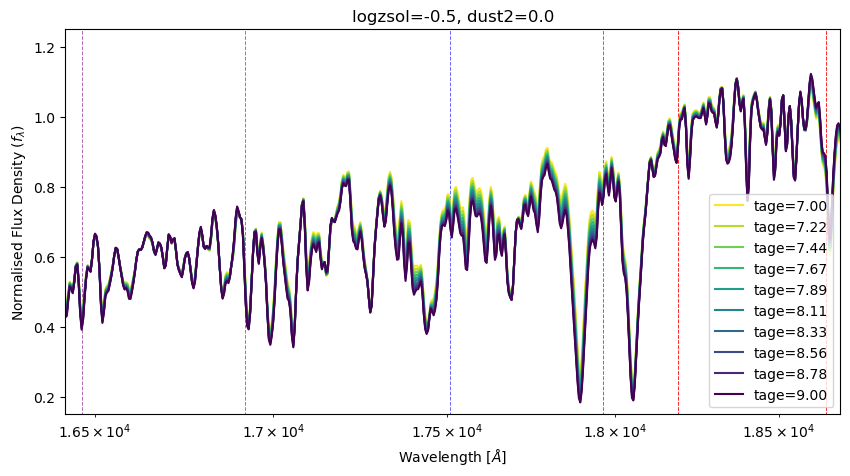

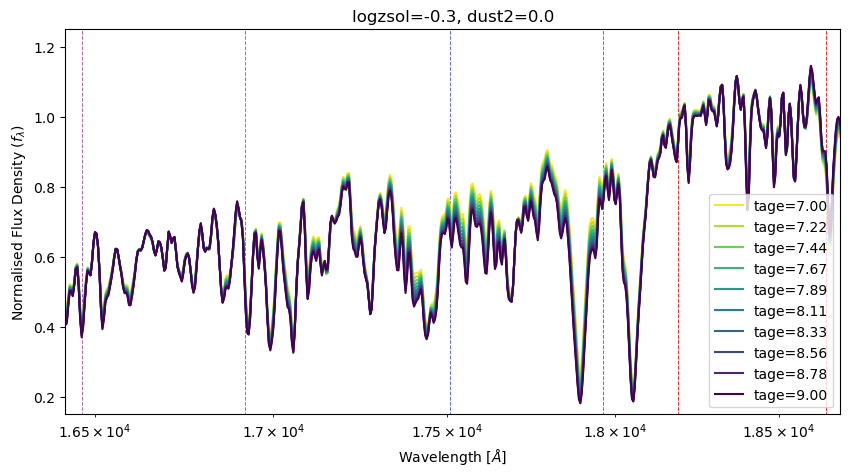

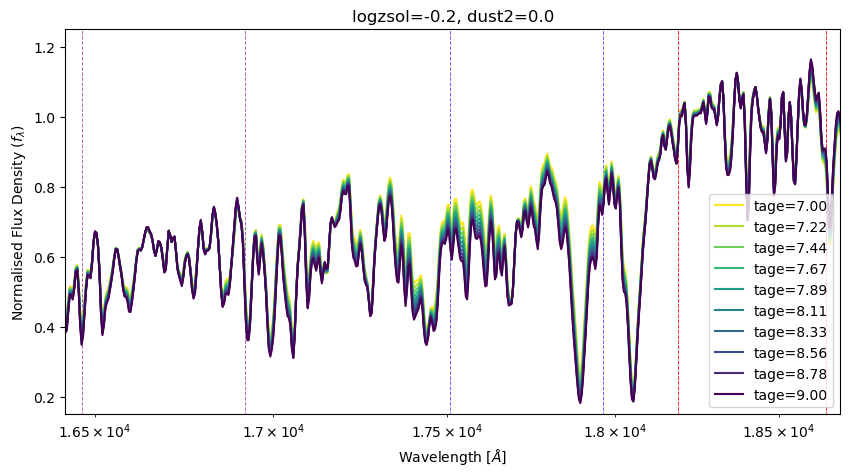

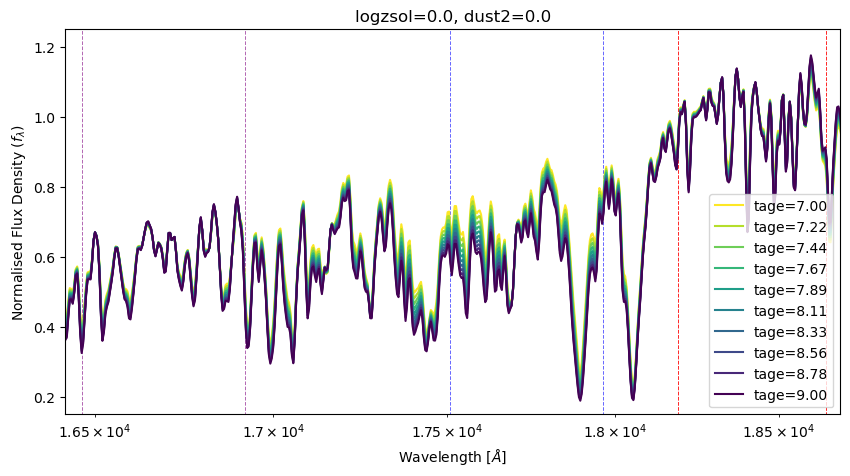

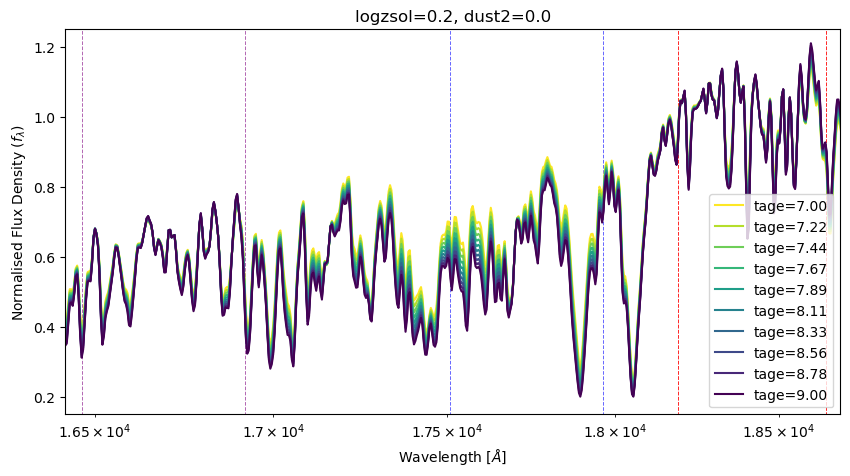

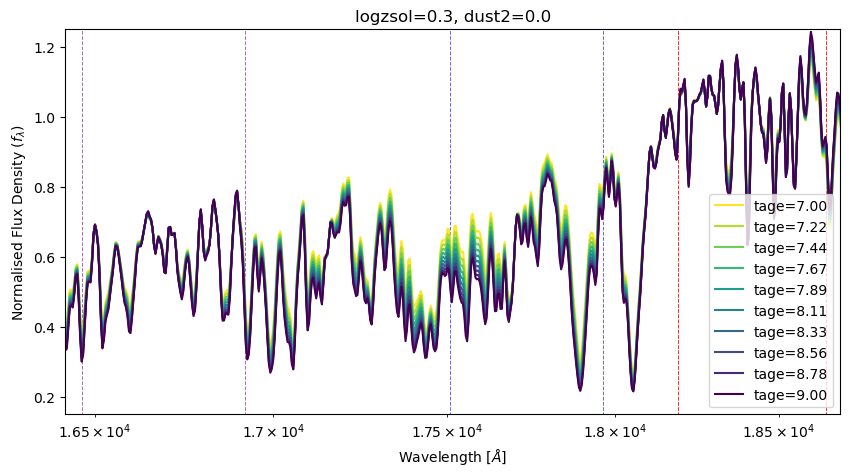

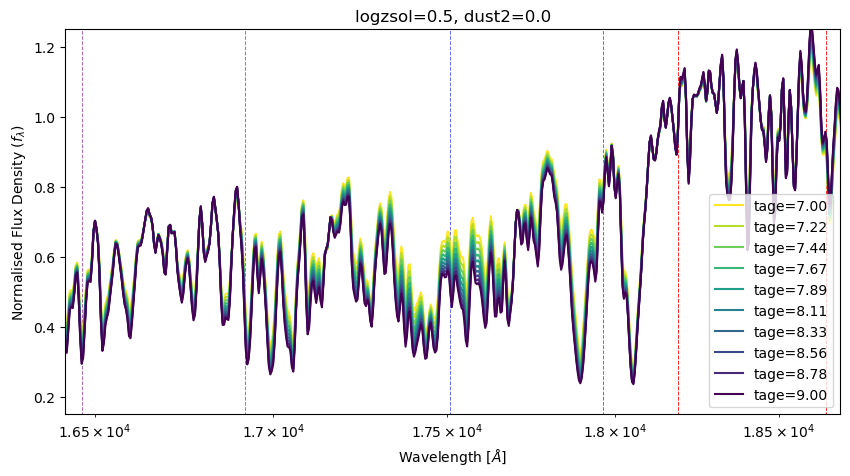

In [16]:
color = cm.viridis_r(np.linspace(0, 1, len(logzs)))

i_dust = 0

for i_logz in range(len(logzs)):

    figure(figsize=(10,5))
    
    plotBalmerBreak(**run_params)
    plotBalmerBreakD4000(**run_params)
    
    plotVerticalLines(4115, 4215, **run_params)
    
    bounds = getBreakBounds(wspec, 4115, **run_params)
    blue_l, blue_u = bounds['blue'][0], bounds['blue'][1]
    
    for i_tage in range(len(tages)):
        test_mean = data_grid_spec[i_logz,i_dust,i_tage,blue_l:blue_u].mean()
        plot(wspec, data_grid_spec[i_logz,i_dust,i_tage,:]/test_mean, color=color[i_tage], lw=1.5, label=f'tage={tages[i_tage]:.2f}')
    
    xmin, xmax = (3610)*a, (4110)*a
    
    xlim([xmin,xmax])
    xscale('log')
    ylim([1.5e-1, 12.5e-1])

    title_text = f'logzsol={logzs[i_logz]:.1f}, dust2={dusts[i_dust]:.1f}'
    title(title_text)

    xlabel(r'Wavelength [$\AA$]')
    ylabel(r'Normalised Flux Density ($f_\lambda$)')

    legend()
    
    show()

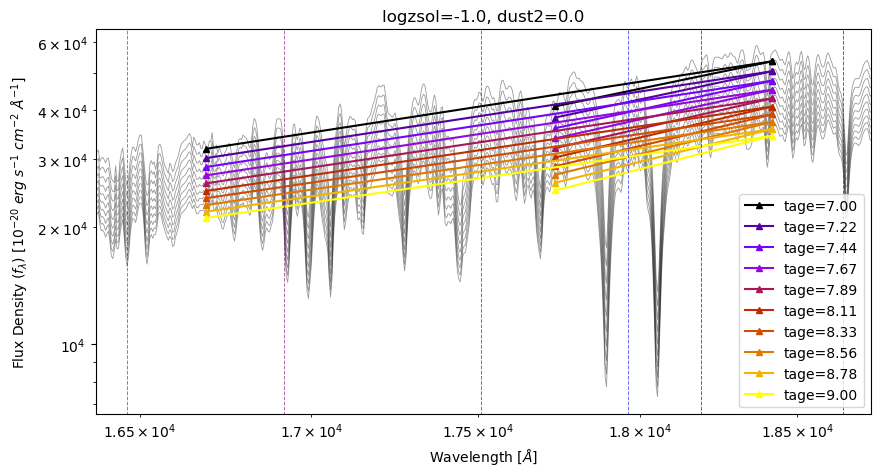

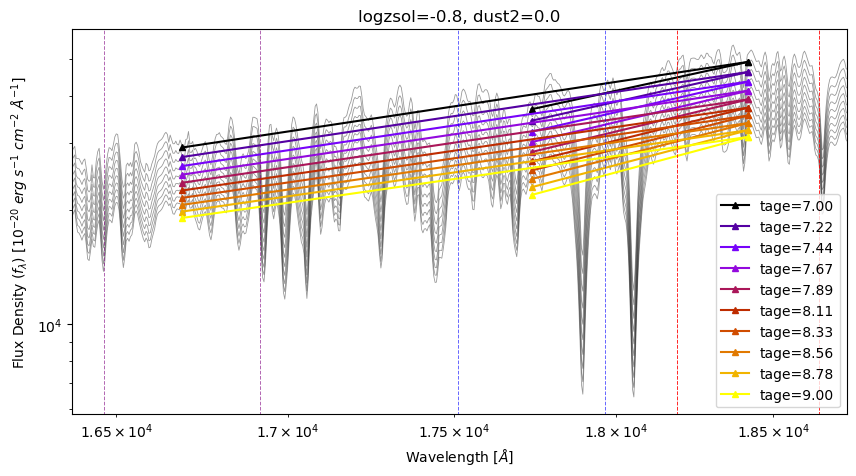

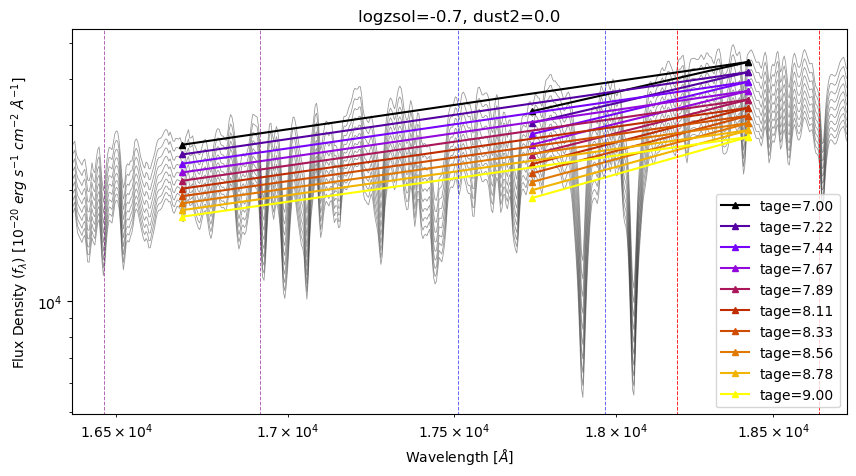

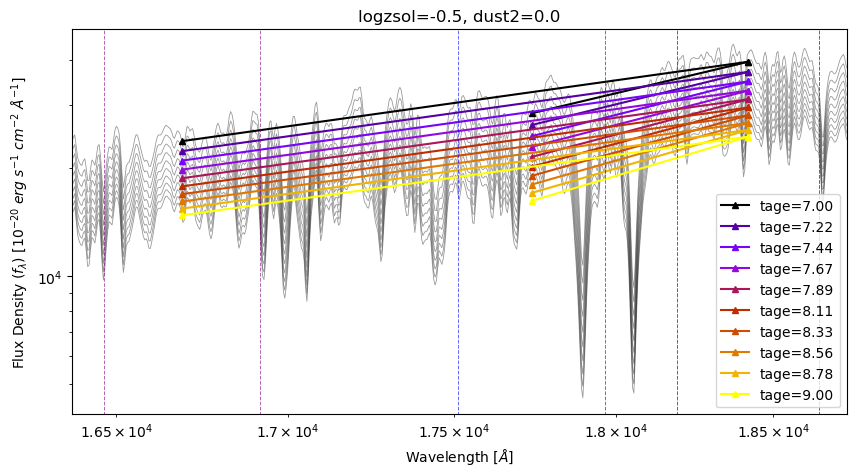

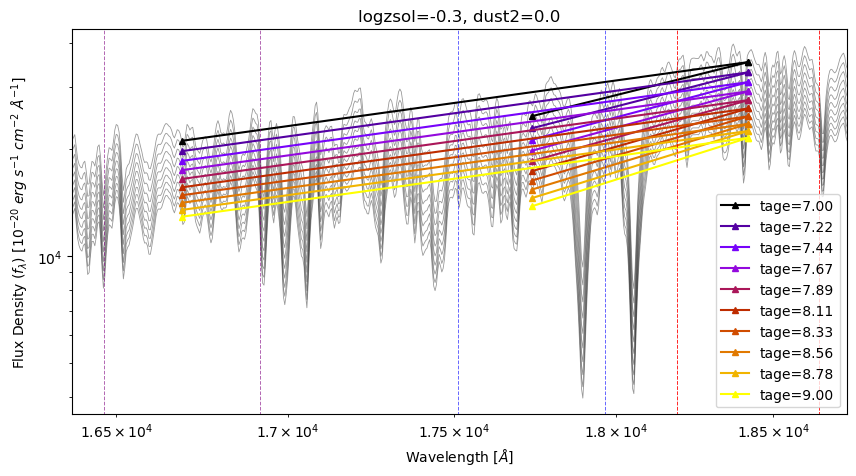

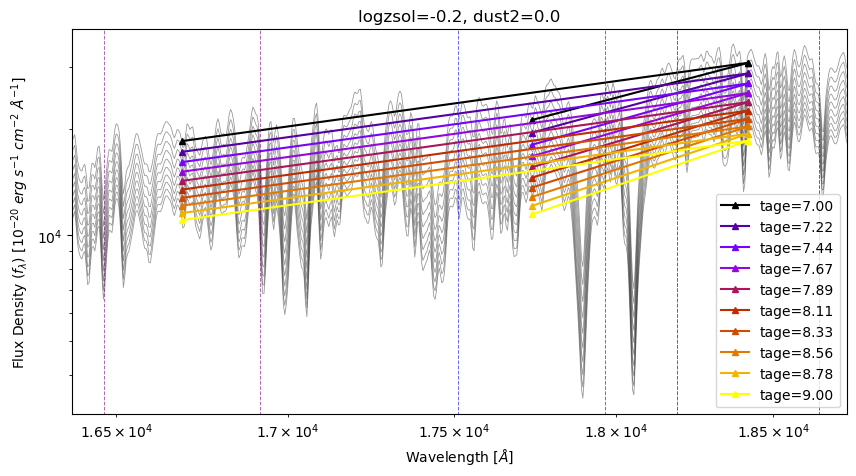

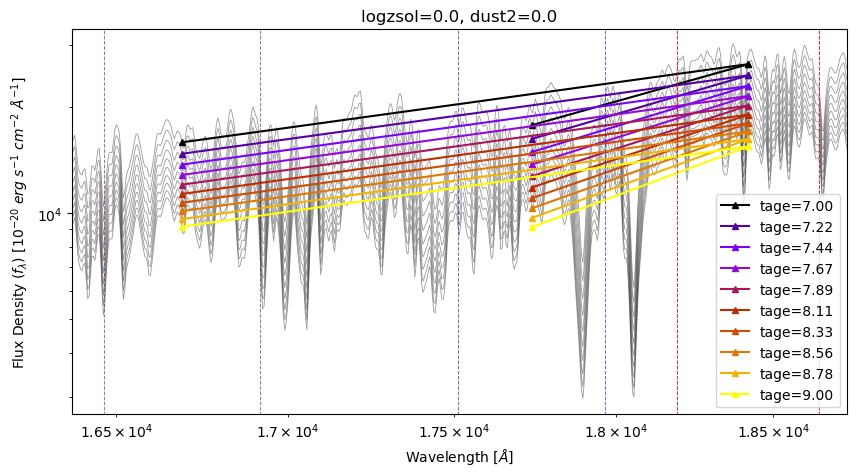

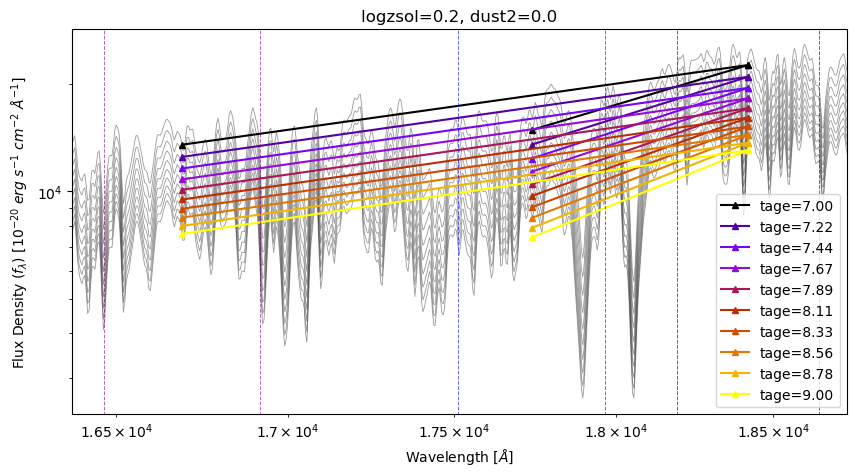

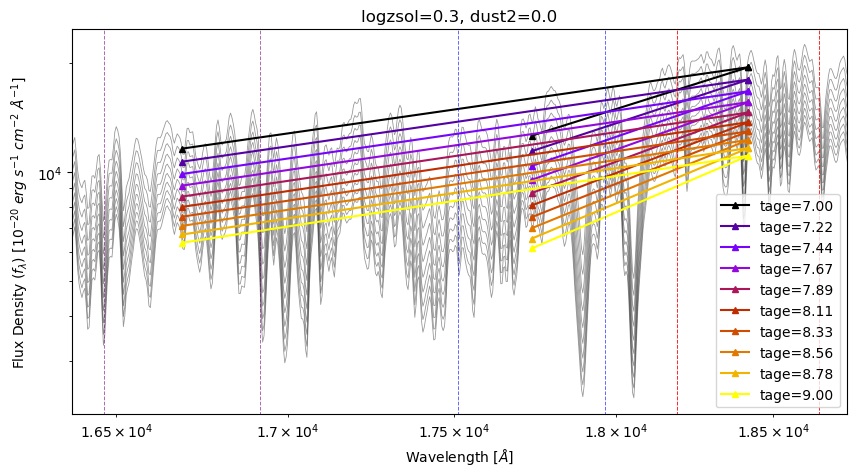

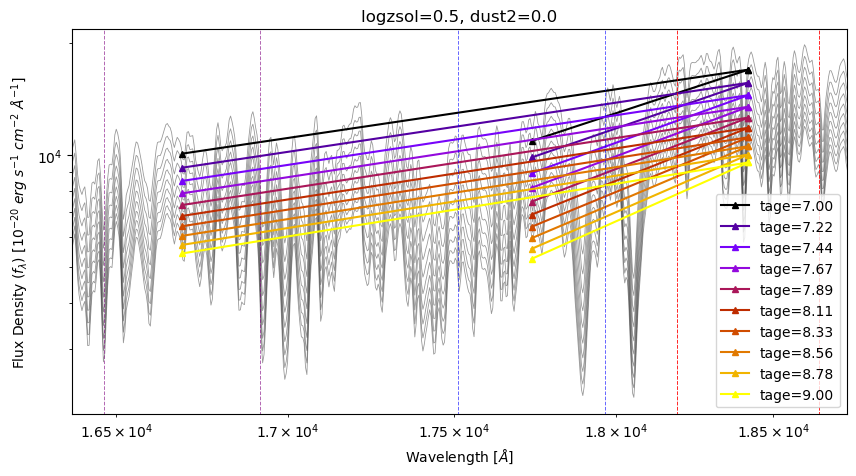

In [220]:
i_dust = 0

a = 1.0 + run_params['zred']

color = cm.gnuplot(np.linspace(0, 1, len(tages)))

for i_logz in range(len(logzs)):

    minis = []
    maxis = []
    
    figure(figsize=(10,5))
    
    for i_tage in range(len(tages)):
    
        loglog(wspec, data_grid_spec[i_logz,i_dust,i_tage,:], lw=.6, alpha=.4, color='black', zorder=1)
        maxis.append(data_grid_spec[i_logz,i_dust,i_tage,382:914].max())
        minis.append(data_grid_spec[i_logz,i_dust,i_tage,382:914].min())

    for i_tage in range(len(tages)):

        plot(data_grid_means[i_logz,i_dust,i_tage,0:2]*a, data_grid_means[i_logz,i_dust,i_tage,[4,6]], marker='^', markersize=4, color=color[i_tage], label=f'tage={tages[i_tage]:.2f}', zorder=2)
        plot(data_grid_means[i_logz,i_dust,i_tage,2:4]*a, data_grid_means[i_logz,i_dust,i_tage,[5,6]], marker='^', markersize=4, color=color[i_tage], zorder=2)
        
    plotBalmerBreakD4000(**run_params)
    plotBalmerBreak(**run_params)

    maxis = np.array(maxis)
    minis = np.array(minis)
    
    xmin, xmax = (3600)*a, (4120)*a
    ymin, ymax = minis.min()*.9, maxis.max()*1.1
    
    xlim([xmin,xmax])
    ylim([ymin,ymax])
    
    xlabel(r'Wavelength [$\AA$]')
    ylabel(r'Flux Density ($f_\lambda$) [$10^{-20}$ $erg$ $s^{-1}$ $cm^{-2}$ $\AA^{-1}$]')
    legend()
    
    title_text = f'logzsol={logzs[i_logz]:.1f}, dust2={dusts[i_dust]:.1f}'
    title(title_text)
    
    show()

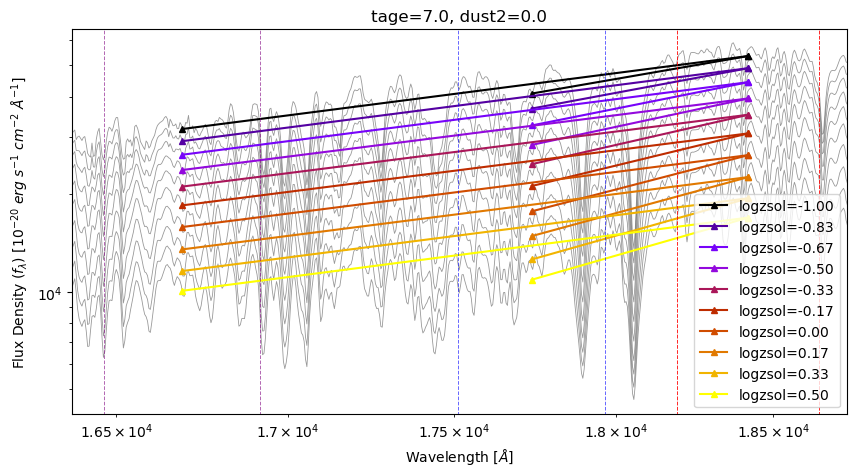

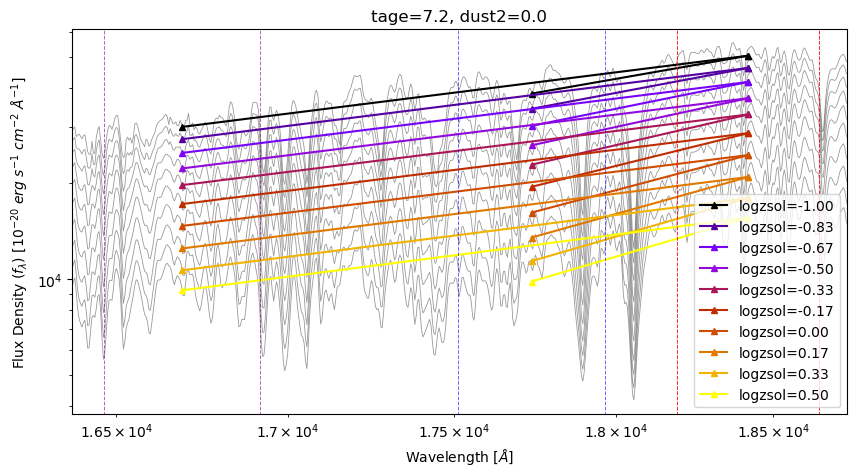

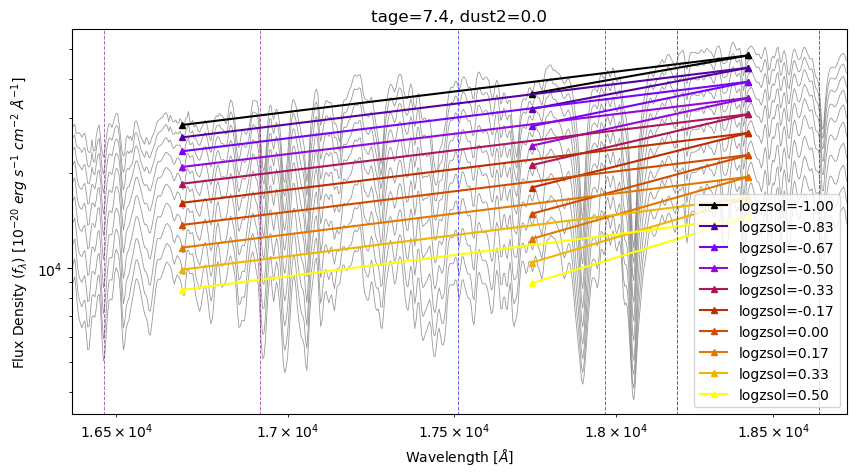

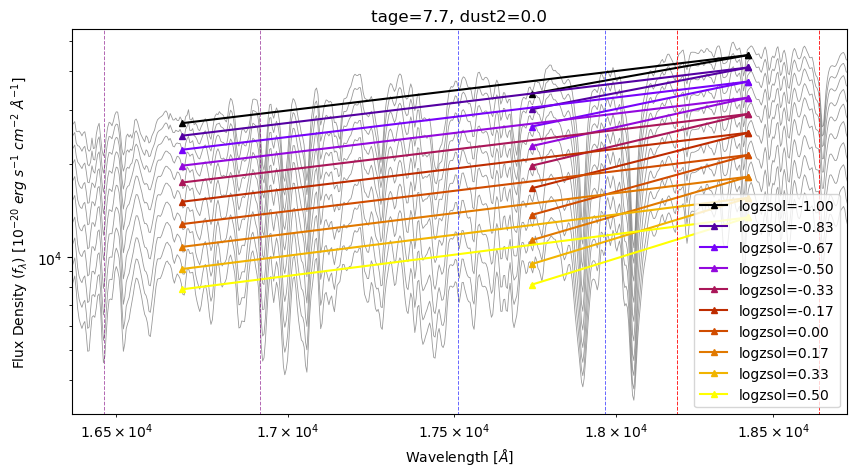

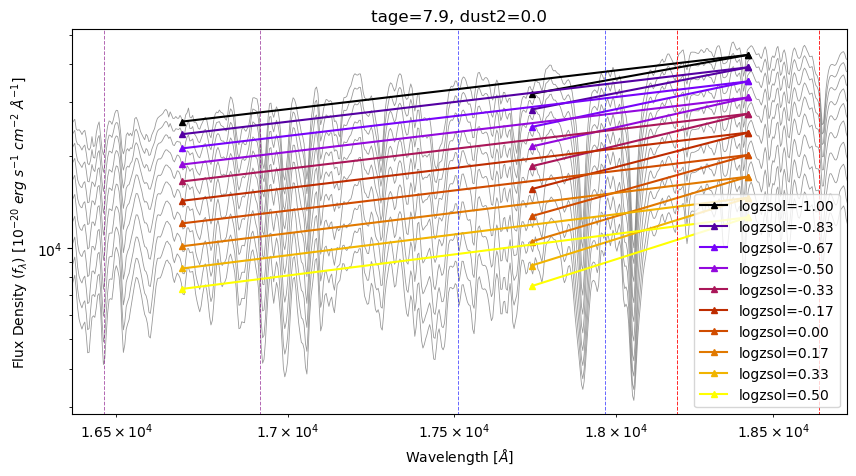

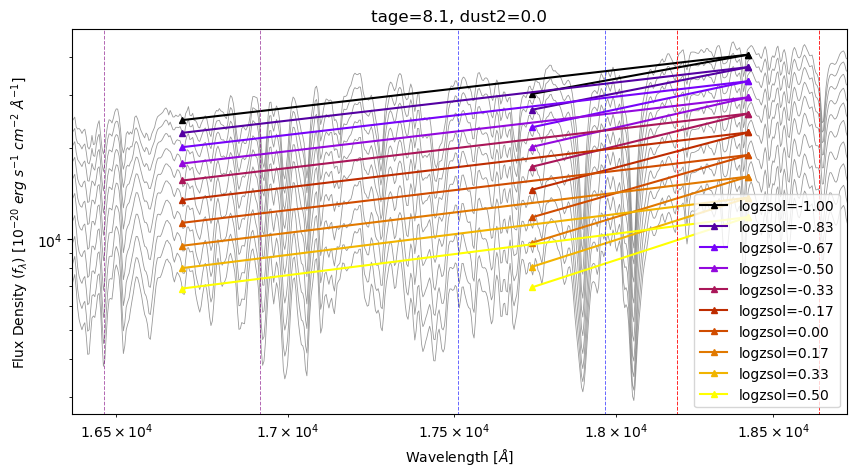

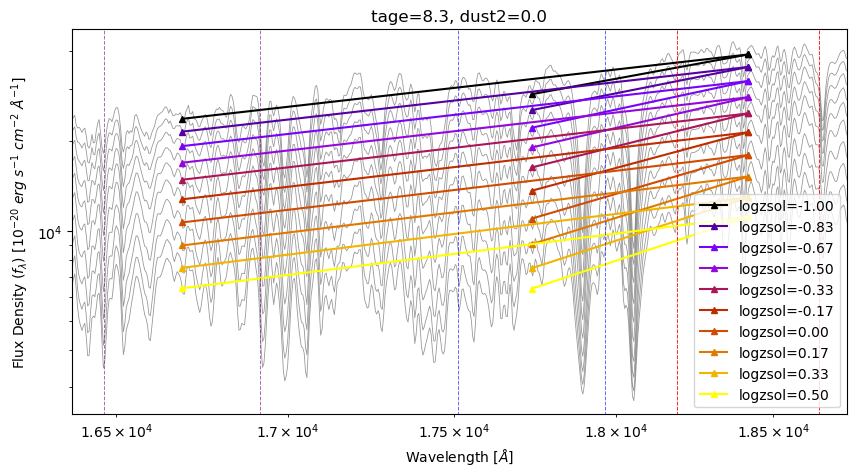

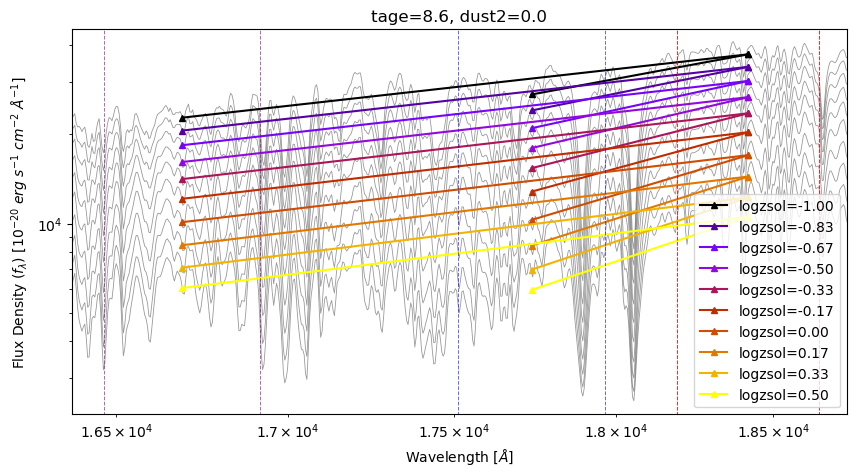

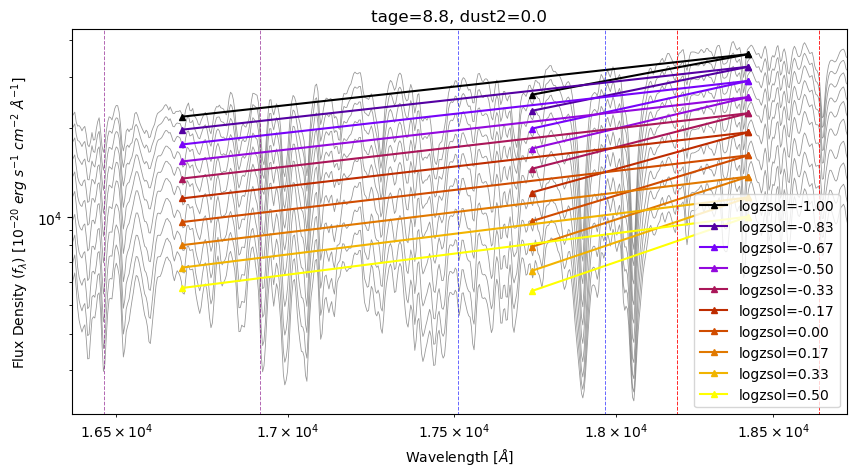

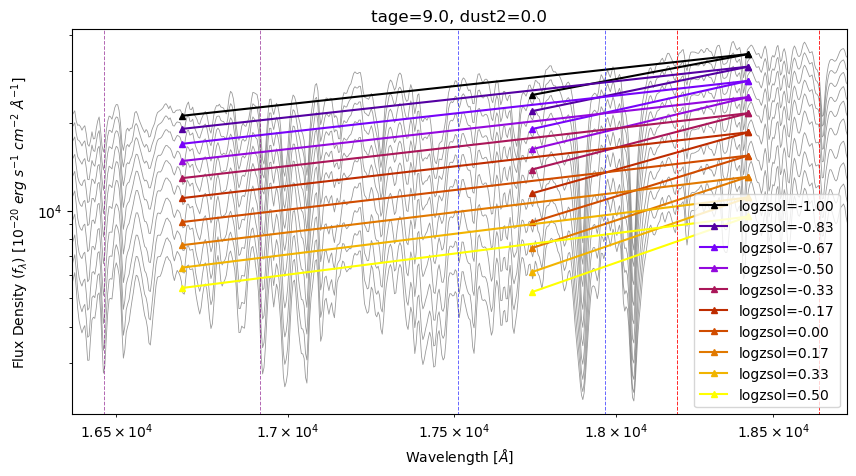

In [227]:
i_dust = 0

color = cm.gnuplot(np.linspace(0, 1, len(logzs)))

for i_tage in range(len(tages)):

    maxis = []
    minis = []
    
    figure(figsize=(10,5))
    
    for i_logz in range(len(logzs)):
    
        loglog(wspec, data_grid_spec[i_logz,i_dust,i_tage,:], lw=.6, alpha=.4, color='black', zorder=1)
        maxis.append(data_grid_spec[i_logz,i_dust,i_tage,382:914].max())
        minis.append(data_grid_spec[i_logz,i_dust,i_tage,382:914].min())

    for i_logz in range(len(logzs)):

        plot(data_grid_means[i_logz,i_dust,i_tage,0:2]*a, data_grid_means[i_logz,i_dust,i_tage,[4,6]], marker='^', markersize=4, color=color[i_logz], label=f'logzsol={logzs[i_logz]:.2f}', zorder=2)
        plot(data_grid_means[i_logz,i_dust,i_tage,2:4]*a, data_grid_means[i_logz,i_dust,i_tage,[5,6]], marker='^', markersize=4, color=color[i_logz], zorder=2)
    
    plotBalmerBreakD4000(**run_params)
    plotBalmerBreak(**run_params)

    maxis = np.array(maxis)
    minis = np.array(minis)
    
    xmin, xmax = (3600)*a, (4120)*a
    ymin, ymax = minis.min()*.9, maxis.max()*1.1
    
    xlim([xmin,xmax])
    ylim([ymin,ymax])
    
    xlabel(r'Wavelength [$\AA$]')
    ylabel(r'Flux Density ($f_\lambda$) [$10^{-20}$ $erg$ $s^{-1}$ $cm^{-2}$ $\AA^{-1}$]')
    legend()
    
    title_text = f'tage={tages[i_tage]:.1f}, dust2={dusts[i_dust]:.1f}'
    title(title_text)
    
    show()

------------

In [23]:
data_grid_means_test = np.empty([10,10,10,7])
data_grid_spec_test = np.empty([10,10,10,5994])

In [24]:
init = time.time()

bounds3620 = getBreakBounds(wspec, 3620, **run_params)
blue_3620, blue_3720 = bounds3620['blue'][0], bounds3620['blue'][1]
bounds3850 = getBreakBounds(wspec, 3850, **run_params)
blue_3850, blue_3950 = bounds3850['blue'][0], bounds3850['blue'][1]
red_4000, red_4100 = bounds3850['red'][0], bounds3850['red'][1]

bounds = getBreakBounds(wspec, 4115, **run_params)
blue_l, blue_u = bounds['blue'][0], bounds['blue'][1]

for i_logz, i_dust, i_tage in itertools.product(range(10), range(10), range(10)):

    test_mean = data_grid_spec[i_logz,i_dust,i_tage,blue_l:blue_u].mean()
    data_grid_spec_test[i_logz,i_dust,i_tage,:] = data_grid_spec[i_logz,i_dust,i_tage,:]/test_mean

    mean_3620 = data_grid_spec_test[i_logz, i_dust, i_tage, blue_3620:blue_3720].mean()
    mean_3850 = data_grid_spec_test[i_logz, i_dust, i_tage, blue_3850:blue_3950].mean()
    mean_4000 = data_grid_spec_test[i_logz, i_dust, i_tage, red_4000:red_4100].mean()

    data_grid_means_test[i_logz,i_dust,i_tage,:] = [3670, 4050, 3900, 4050, mean_3620, mean_3850, mean_4000]
    
end = time.time()
print(end-init)

0.08698344230651855


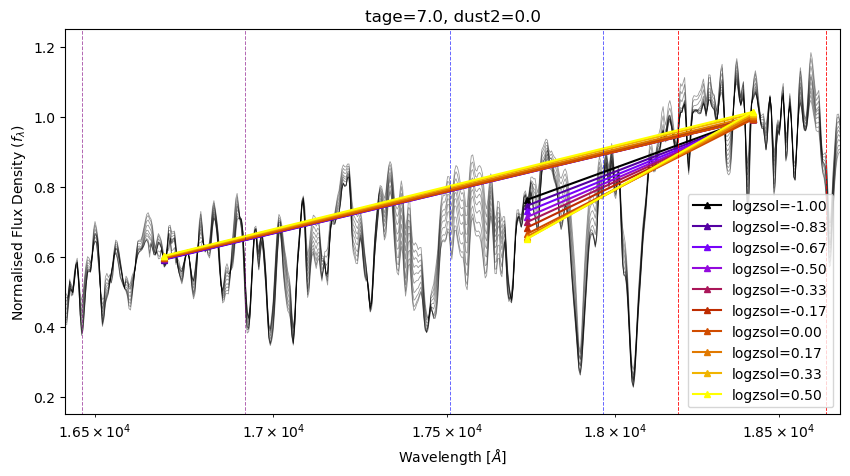

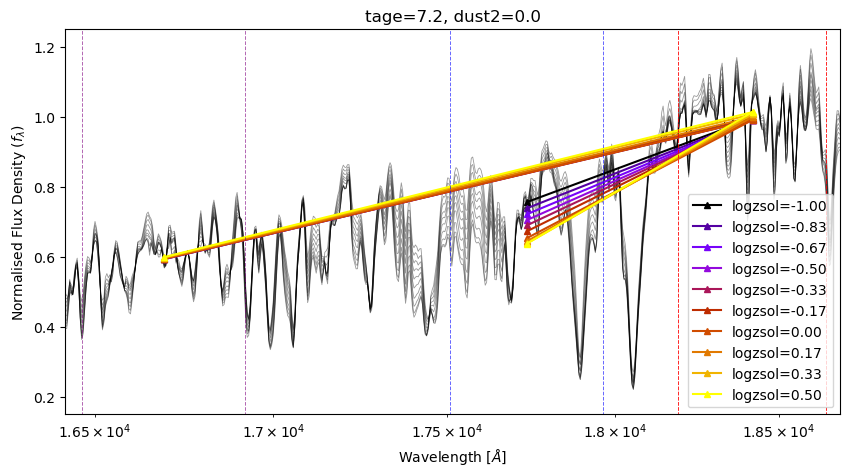

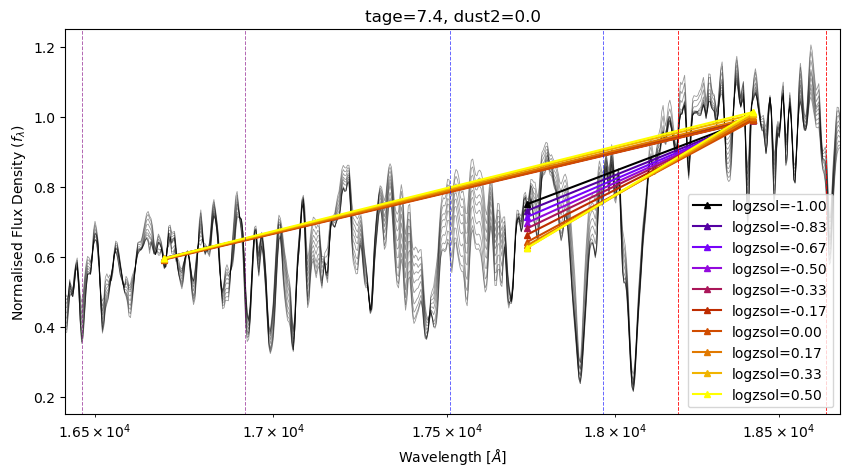

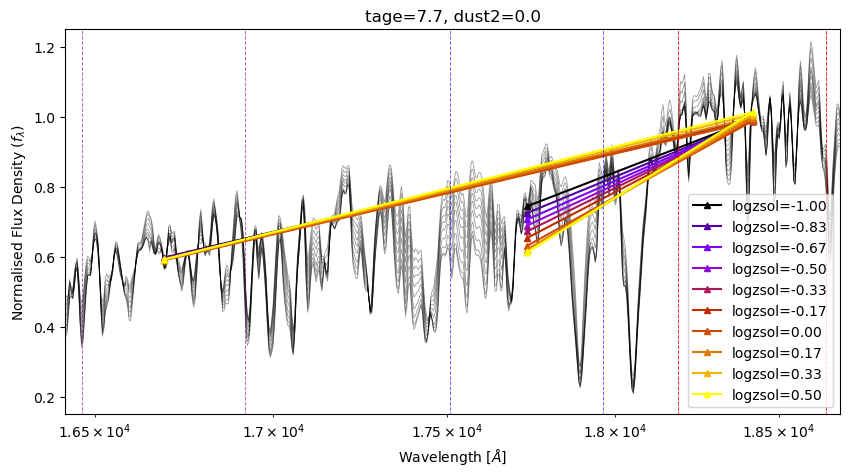

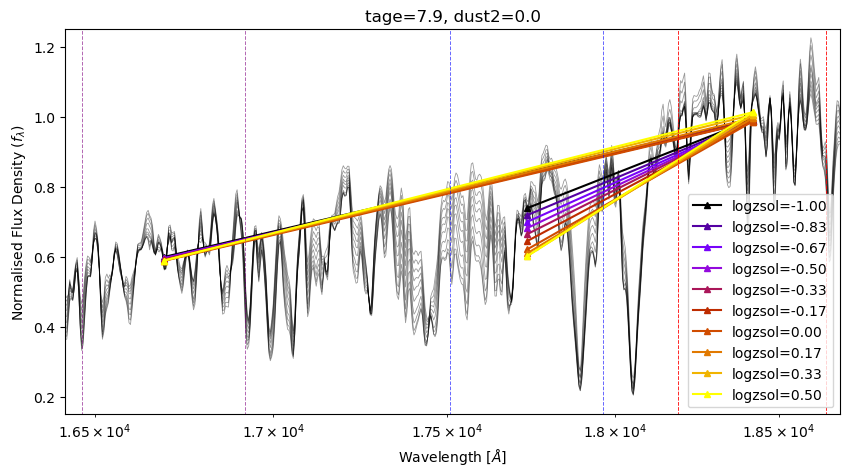

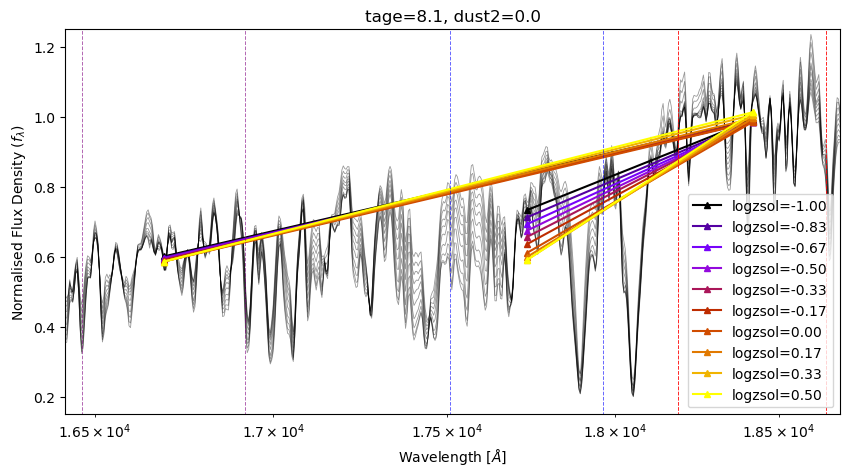

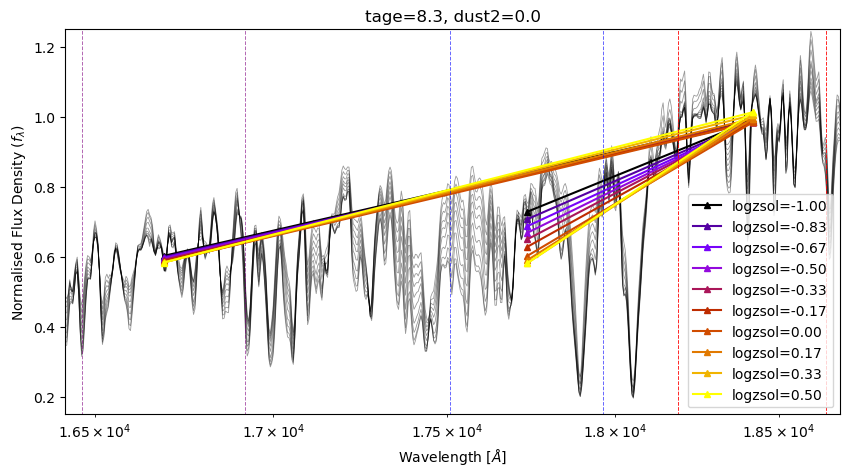

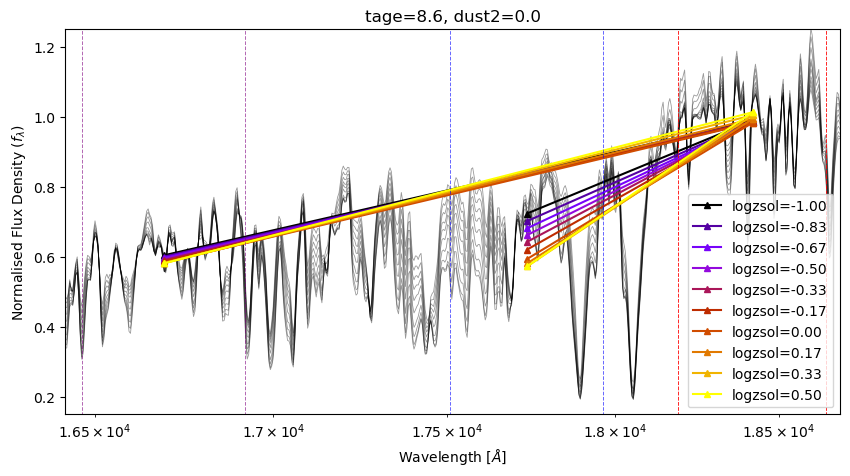

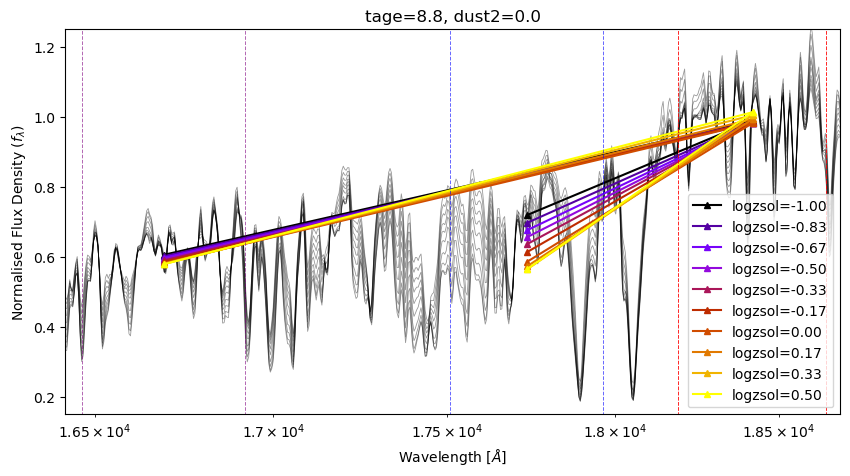

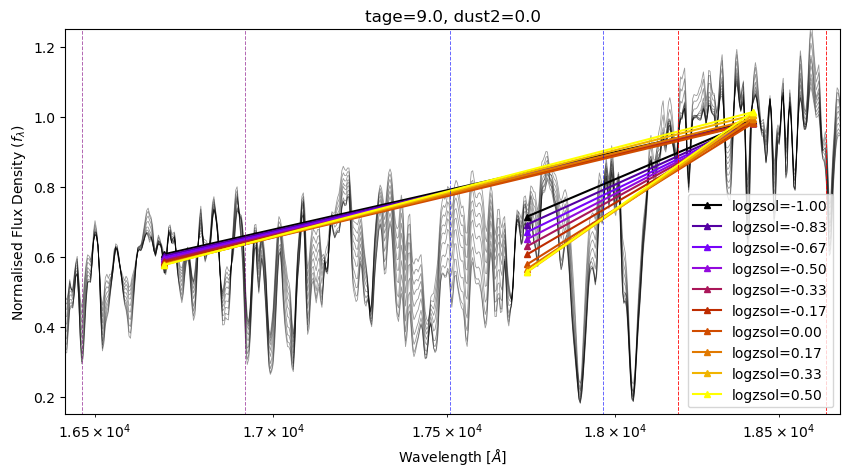

In [37]:
i_dust = 0

color = cm.gnuplot(np.linspace(0, 1, len(logzs)))

bounds = getBreakBounds(wspec, 4115, **run_params)
blue_l, blue_u = bounds['blue'][0], bounds['blue'][1]

for i_tage in range(len(tages)):

    maxis = []
    minis = []
    
    figure(figsize=(10,5))
    
    for i_logz in range(len(logzs)):

        test_mean = data_grid_spec[i_logz,i_dust,i_tage,blue_l:blue_u].mean()
    
        plot(wspec, data_grid_spec[i_logz,i_dust,i_tage,:]/test_mean, lw=.6, alpha=.4, color='black', zorder=1)
        maxis.append(data_grid_spec[i_logz,i_dust,i_tage,382:914].max())
        minis.append(data_grid_spec[i_logz,i_dust,i_tage,382:914].min())

    for i_logz in range(len(logzs)):

        plot(data_grid_means_test[i_logz,i_dust,i_tage,0:2]*a, data_grid_means_test[i_logz,i_dust,i_tage,[4,6]], marker='^', markersize=4, color=color[i_logz], label=f'logzsol={logzs[i_logz]:.2f}', zorder=2)
        plot(data_grid_means_test[i_logz,i_dust,i_tage,2:4]*a, data_grid_means_test[i_logz,i_dust,i_tage,[5,6]], marker='^', markersize=4, color=color[i_logz], zorder=2)
    
    plotBalmerBreakD4000(**run_params)
    plotBalmerBreak(**run_params)

    maxis = np.array(maxis)
    minis = np.array(minis)
    
    xmin, xmax = (3610)*a, (4110)*a
    
    xlim([xmin,xmax])
    xscale('log')
    ylim([1.5e-1, 12.5e-1])
    
    xlabel(r'Wavelength [$\AA$]')
    ylabel(r'Normalised Flux Density ($f_\lambda$)')
    
    legend()
    
    title_text = f'tage={tages[i_tage]:.1f}, dust2={dusts[i_dust]:.1f}'
    title(title_text)
    
    show()

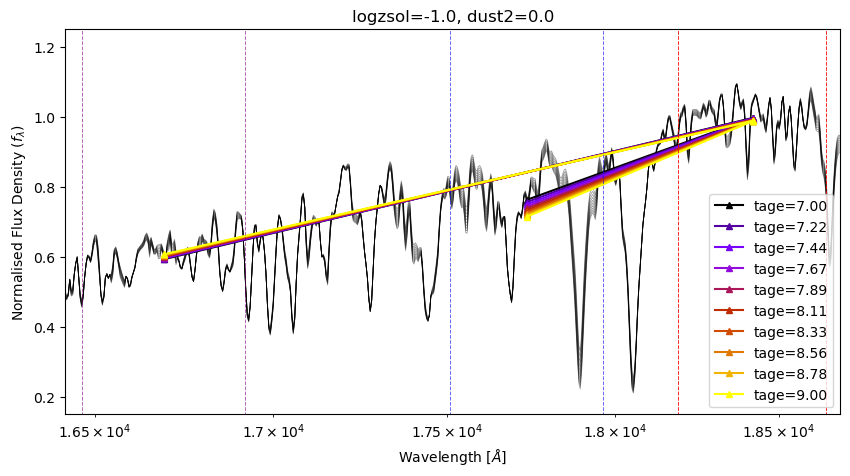

In [38]:
i_dust = 0

color = cm.gnuplot(np.linspace(0, 1, len(tages)))

bounds = getBreakBounds(wspec, 4115, **run_params)
blue_l, blue_u = bounds['blue'][0], bounds['blue'][1]

for i_logz in range(len(logzs[:1])):

    maxis = []
    minis = []
    
    figure(figsize=(10,5))
    
    for i_tage in range(len(tages)):

        test_mean = data_grid_spec[i_logz,i_dust,i_tage,blue_l:blue_u].mean()
    
        plot(wspec, data_grid_spec[i_logz,i_dust,i_tage,:]/test_mean, lw=.6, alpha=.4, color='black', zorder=1)
        maxis.append(data_grid_spec[i_logz,i_dust,i_tage,382:914].max())
        minis.append(data_grid_spec[i_logz,i_dust,i_tage,382:914].min())

    for i_tage in range(len(tages)):

        plot(data_grid_means_test[i_logz,i_dust,i_tage,0:2]*a, data_grid_means_test[i_logz,i_dust,i_tage,[4,6]], marker='^', markersize=4, color=color[i_tage], label=f'tage={tages[i_tage]:.2f}', zorder=2)
        plot(data_grid_means_test[i_logz,i_dust,i_tage,2:4]*a, data_grid_means_test[i_logz,i_dust,i_tage,[5,6]], marker='^', markersize=4, color=color[i_tage], zorder=2)
    
    plotBalmerBreakD4000(**run_params)
    plotBalmerBreak(**run_params)

    maxis = np.array(maxis)
    minis = np.array(minis)
    
    xmin, xmax = (3610)*a, (4110)*a
    
    xlim([xmin,xmax])
    xscale('log')
    ylim([1.5e-1, 12.5e-1])
    
    xlabel(r'Wavelength [$\AA$]')
    ylabel(r'Normalised Flux Density ($f_\lambda$)')
    
    legend()
    
    title_text = f'logzsol={logzs[i_logz]:.1f}, dust2={dusts[i_dust]:.1f}'
    title(title_text)

    savefig('test_1')
    
    show()

---------

In [4]:
import numpy as np

data_grid_specs = np.load('specs_imf_0_60000.npy')
data_grid_params = np.load('params_imf_0_60000.npy')

In [7]:
data_grid_params[0,0,:,-1]

array([0.1       , 0.10307224, 0.10623887, 0.10950278, 0.11286697,
       0.11633452, 0.11990859, 0.12359247, 0.12738953, 0.13130324,
       0.1353372 , 0.13949508, 0.1437807 , 0.14819799, 0.15275099,
       0.15744387, 0.16228092, 0.16726659, 0.17240542, 0.17770213,
       0.18316156, 0.18878873, 0.19458877, 0.20056701, 0.20672891,
       0.21308012, 0.21962645, 0.2263739 , 0.23332866, 0.24049707,
       0.24788572, 0.25550137, 0.26335099, 0.27144176, 0.27978111,
       0.28837665, 0.29723628, 0.30636809, 0.31578046, 0.32548199,
       0.33548158, 0.34578839, 0.35641184, 0.36736167, 0.3786479 ,
       0.39028088, 0.40227124, 0.41462998, 0.42736842, 0.4404982 ,
       0.45403137, 0.4679803 , 0.48235778, 0.49717698, 0.51245145,
       0.52819519, 0.54442262, 0.56114859, 0.57838843, 0.59615791,
       0.61447332, 0.63335141, 0.65280949, 0.67286537, 0.69353742,
       0.71484455, 0.7368063 , 0.75944276, 0.78277467, 0.80682339,
       0.83161095, 0.85716004, 0.88349406, 0.91063712, 0.93861